# Analysis of `alarm_violations.csv`

For each parameter ...
* Concerning alarm violations ...
  * Create a boxplot and stripplot based on the VALUENUM
  * Clean the data if necessary
  * Create histogram for cleaned VALUENUM  
* Concerning alarm thresholds ...
  * Create a boxplot and stripplot based on the THRESHOLD_VALUE (stratified by THRESHOLD_TYPE)
  * Clean the data if necessary
  * Create histogram for cleaned THRESHOLD_VALUE (stratified by THRESHOLD_TYPE)


## Import Data

In [12]:
# Overview: Import all libraries used.
import numpy as np
import pandas as pd
#import scipy
#import matplotlib.pyplot as plt
import seaborn as sns
#import sklearn

In [1]:
import pandas as pd
alarm_violations = pd.read_csv('./alarm_violations.csv')
alarm_violations.head()

,ROW_ID,ICUSTAY_ID,ITEMID,CHARTTIME,VALUENUM,VALUEUOM,THRESHOLD_ROW_ID,THRESHOLD_ITEMID,THRESHOLD_CHARTTIME,THRESHOLD_VALUE,THRESHOLD_TYPE
0,188506,262147.0,220045,2108-02-21 19:00:00,127.0,bpm,188397,220046,2108-02-21 07:00:00,120.0,HIGH
1,188690,262147.0,220277,2108-02-22 03:55:00,89.0,%,188518,223770,2108-02-21 19:34:00,90.0,LOW
2,188742,262147.0,220277,2108-02-22 07:00:00,87.0,%,188723,223770,2108-02-22 04:22:00,88.0,LOW
3,188683,262147.0,220210,2108-02-22 03:50:00,38.0,insp/min,188519,224161,2108-02-21 19:34:00,35.0,HIGH
4,32060004,262154.0,224687,2105-12-09 00:30:00,3.0,L/min,32059994,220292,2105-12-09 00:30:00,3.5,LOW


## Parameter: Heart Rate

* `220045` **Heart Rate** (HR), metavision, in bpm (numeric)
* `220046` **Heart rate Alarm - High** (HR Alarm - High), metavision, in bpm (numeric)
* `220047` **Heart rate Alarm - Low** (HR Alarm - Low), metavision, in bpm (numeric)

### Heart Rate - Alarm Violations

In [2]:
HR_violations = alarm_violations[(alarm_violations["ITEMID"] == 220045)]
display(HR_violations)

,ROW_ID,ICUSTAY_ID,ITEMID,CHARTTIME,VALUENUM,VALUEUOM,THRESHOLD_ROW_ID,THRESHOLD_ITEMID,THRESHOLD_CHARTTIME,THRESHOLD_VALUE,THRESHOLD_TYPE
0,188506,262147.0,220045,2108-02-21 19:00:00,127.0,bpm,188397,220046,2108-02-21 07:00:00,120.0,HIGH
5,32059315,262154.0,220045,2105-12-08 03:13:00,131.0,bpm,32059237,220046,2105-12-07 19:25:00,120.0,HIGH
6,32059317,262154.0,220045,2105-12-08 03:15:00,142.0,bpm,32059237,220046,2105-12-07 19:25:00,120.0,HIGH
7,32059320,262154.0,220045,2105-12-08 03:17:00,152.0,bpm,32059237,220046,2105-12-07 19:25:00,120.0,HIGH
8,32059325,262154.0,220045,2105-12-08 03:18:00,135.0,bpm,32059237,220046,2105-12-07 19:25:00,120.0,HIGH
...,...,...,...,...,...,...,...,...,...,...,...
388151,14457580,262135.0,220045,2161-06-14 14:00:00,106.0,bpm,14457492,220046,2161-06-14 08:00:00,100.0,HIGH
388152,14457618,262135.0,220045,2161-06-14 17:00:00,107.0,bpm,14457492,220046,2161-06-14 08:00:00,100.0,HIGH
388153,14457627,262135.0,220045,2161-06-14 18:00:00,102.0,bpm,14457492,220046,2161-06-14 08:00:00,100.0,HIGH
388154,14457633,262135.0,220045,2161-06-14 19:00:00,106.0,bpm,14457492,220046,2161-06-14 08:00:00,100.0,HIGH


In [3]:
HR_violations.VALUENUM.describe()

count    97148.000000
mean       101.535667
std        282.400013
min        -88.000000
25%         58.000000
50%        121.000000
75%        129.000000
max      86101.000000
Name: VALUENUM, dtype: float64

<AxesSubplot:xlabel='VALUENUM'>

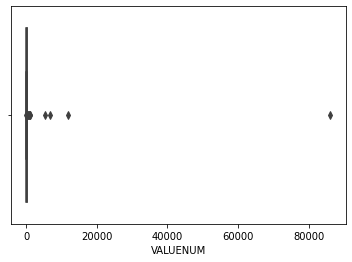

In [4]:
import seaborn as sns
sns.boxplot(data=HR_violations, x='VALUENUM')

Among the VALUENUM values is at least one negative heart rate (min = -88) and a maximum heart rate of 86101 bpm.
These appear to be implausible outliers.

Let's check whether the unit (VALUEUOM) is "bpm" for all heart rates (what is expected according to `D_ITEMS.csv`).

In [5]:
HR_violations.VALUEUOM.unique()

array(['bpm'], dtype=object)

All heart rates are given in bpm as expected.

Let's check the literature to see what heart rates can be expected based on medical knowledge.

* General guideline: "*To estimate your maximum age-related heart rate, subtract your age from 220.*" (https://www.cdc.gov/physicalactivity/basics/measuring/heartrate.htm)
  * First idea: Let's take >220 as upper cut off when removing implausible outliers
* "*The fastest human ventricular conduction rate reported to date is a conducted tachyarrhythmia with ventricular rate of 480 beats per minute*" (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3273956/)
  * Second idea: Let's take >480 as upper cut off when removing implausible outliers
* Pacemakers may be the reason why heart rates are recorded around 1000 and higher.
  * Came to my attention via https://www.quora.com/What-is-the-fastest-heartbeat-rate-ever-recorded
  * Investigate later and find literature on this.

Decision for now: Consider heart rates below 0 and above 480 bpm as implausible values to be removed before further analysis.

In [6]:
HR_violations_clean = HR_violations[(HR_violations["VALUENUM"] >= 0) & (HR_violations["VALUENUM"] <= 480)]
HR_violations_removed_too_low = HR_violations[(HR_violations["VALUENUM"] < 0)]
HR_violations_removed_too_high = HR_violations[(HR_violations["VALUENUM"] > 480)]

In [7]:
# Check rows that were removed because of too low VALUENUM
display(HR_violations_removed_too_low.sort_values(by=['VALUENUM']))
HR_violations_removed_too_low.VALUENUM.describe()
# To me, seems to make sense to remove them.

,ROW_ID,ICUSTAY_ID,ITEMID,CHARTTIME,VALUENUM,VALUEUOM,THRESHOLD_ROW_ID,THRESHOLD_ITEMID,THRESHOLD_CHARTTIME,THRESHOLD_VALUE,THRESHOLD_TYPE
28555,93327,270525.0,220045,2185-04-11 16:00:00,-88.0,bpm,93329,220047,2185-04-11 16:00:00,50.0,LOW
48460,12518045,275893.0,220045,2158-07-12 22:00:00,-1.0,bpm,12518026,220047,2158-07-12 20:18:00,50.0,LOW


count     2.00000
mean    -44.50000
std      61.51829
min     -88.00000
25%     -66.25000
50%     -44.50000
75%     -22.75000
max      -1.00000
Name: VALUENUM, dtype: float64

In [8]:
# Check rows that were removed because of too high VALUENUM
display(HR_violations_removed_too_high.sort_values(by=['VALUENUM']))
HR_violations_removed_too_high.VALUENUM.describe()
# To me, seems to make sense to remove them. Maybe we will reconsider after following up on the pacemaker issue.
# Question that came to my mind: Should we train the ML model only on clean data or should we include outliers as they appear in the real data and might have a 'hidden meaning'?

,ROW_ID,ICUSTAY_ID,ITEMID,CHARTTIME,VALUENUM,VALUEUOM,THRESHOLD_ROW_ID,THRESHOLD_ITEMID,THRESHOLD_CHARTTIME,THRESHOLD_VALUE,THRESHOLD_TYPE
97909,11398850,289346.0,220045,2186-05-25 06:55:00,770.0,bpm,11398793,220046,2186-05-25 06:13:00,120.0,HIGH
275881,16724049,232723.0,220045,2109-11-13 17:06:00,880.0,bpm,16723990,220046,2109-11-13 08:00:00,120.0,HIGH
68149,27969920,280838.0,220045,2197-08-07 12:00:00,950.0,bpm,27969875,220046,2197-08-07 07:28:00,120.0,HIGH
16253,29605878,267073.0,220045,2184-11-26 16:00:00,1109.0,bpm,29605844,220046,2184-11-26 12:00:00,120.0,HIGH
42124,9063568,274340.0,220045,2153-08-10 07:00:00,5409.0,bpm,9063364,220046,2153-08-09 20:31:00,120.0,HIGH
40661,730714,274086.0,220045,2142-03-13 07:00:00,6632.0,bpm,730677,220046,2142-03-13 04:00:00,120.0,HIGH
349169,25363707,252668.0,220045,2155-06-08 01:00:00,11710.0,bpm,25363663,220046,2155-06-07 20:00:00,135.0,HIGH
209728,9537445,214944.0,220045,2115-10-29 04:00:00,86101.0,bpm,9537322,220046,2115-10-28 20:00:00,120.0,HIGH


count        8.000000
mean     14195.125000
std      29314.146017
min        770.000000
25%        932.500000
50%       3259.000000
75%       7901.500000
max      86101.000000
Name: VALUENUM, dtype: float64

In [10]:
# Check cleaned HR_violations
display(HR_violations_clean.sort_values(by=['VALUENUM']))
HR_violations_clean.VALUENUM.describe()

,ROW_ID,ICUSTAY_ID,ITEMID,CHARTTIME,VALUENUM,VALUEUOM,THRESHOLD_ROW_ID,THRESHOLD_ITEMID,THRESHOLD_CHARTTIME,THRESHOLD_VALUE,THRESHOLD_TYPE
301350,19426727,240402.0,220045,2133-02-20 13:40:00,0.0,bpm,19426420,220047,2133-02-20 08:40:00,50.0,LOW
128679,29953763,296490.0,220045,2192-10-27 15:25:00,0.0,bpm,29951316,220047,2192-10-27 08:00:00,60.0,LOW
128678,29953762,296490.0,220045,2192-10-27 15:24:00,0.0,bpm,29951316,220047,2192-10-27 08:00:00,60.0,LOW
128677,29953760,296490.0,220045,2192-10-27 15:23:00,0.0,bpm,29951316,220047,2192-10-27 08:00:00,60.0,LOW
83735,1699959,284839.0,220045,2192-01-05 15:04:00,0.0,bpm,1699866,220047,2192-01-05 09:26:00,60.0,LOW
...,...,...,...,...,...,...,...,...,...,...,...
170659,1153959,204162.0,220045,2141-03-21 00:07:00,268.0,bpm,1153901,220046,2141-03-20 20:00:00,120.0,HIGH
75613,21877744,283034.0,220045,2138-09-21 07:00:00,270.0,bpm,21877647,220046,2138-09-20 20:00:00,130.0,HIGH
75615,21877770,283034.0,220045,2138-09-21 10:00:00,280.0,bpm,21877647,220046,2138-09-20 20:00:00,130.0,HIGH
75616,21877815,283034.0,220045,2138-09-21 15:00:00,280.0,bpm,21877647,220046,2138-09-20 20:00:00,130.0,HIGH


count    97138.000000
mean       100.377967
std         38.369356
min          0.000000
25%         58.000000
50%        121.000000
75%        129.000000
max        459.000000
Name: VALUENUM, dtype: float64

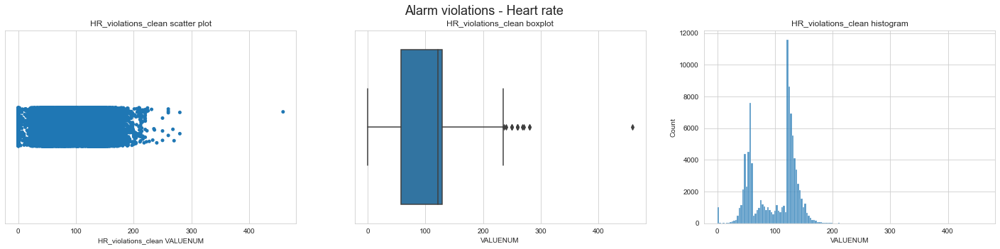

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

fig, axs = plt.subplots(1, 3, figsize=(25, 5))
fig.suptitle("Heart Rate - Alarm Violations", fontsize=18)

sns.stripplot(data=HR_violations_clean, x='VALUENUM', ax=axs[0])
axs[0].set_title("HR_violations_clean scatter plot")
axs[0].set_xlabel("HR_violations_clean VALUENUM")

sns.boxplot(data=HR_violations_clean, x='VALUENUM', ax=axs[1])
axs[1].set_title("HR_violations_clean boxplot")
axs[1].set_xlabel("HR_violations_clean VALUENUM")

sns.histplot(data=HR_violations_clean, x='VALUENUM', ax=axs[2])
axs[2].set_title("HR_violations_clean histogram")
axs[2].set_xlabel("HR_violations_clean VALUENUM")

plt.show(fig)

### Heart Rate - Alarm Thresholds

In [17]:
display(HR_violations)

,ROW_ID,ICUSTAY_ID,ITEMID,CHARTTIME,VALUENUM,VALUEUOM,THRESHOLD_ROW_ID,THRESHOLD_ITEMID,THRESHOLD_CHARTTIME,THRESHOLD_VALUE,THRESHOLD_TYPE
0,188506,262147.0,220045,2108-02-21 19:00:00,127.0,bpm,188397,220046,2108-02-21 07:00:00,120.0,HIGH
5,32059315,262154.0,220045,2105-12-08 03:13:00,131.0,bpm,32059237,220046,2105-12-07 19:25:00,120.0,HIGH
6,32059317,262154.0,220045,2105-12-08 03:15:00,142.0,bpm,32059237,220046,2105-12-07 19:25:00,120.0,HIGH
7,32059320,262154.0,220045,2105-12-08 03:17:00,152.0,bpm,32059237,220046,2105-12-07 19:25:00,120.0,HIGH
8,32059325,262154.0,220045,2105-12-08 03:18:00,135.0,bpm,32059237,220046,2105-12-07 19:25:00,120.0,HIGH
...,...,...,...,...,...,...,...,...,...,...,...
388151,14457580,262135.0,220045,2161-06-14 14:00:00,106.0,bpm,14457492,220046,2161-06-14 08:00:00,100.0,HIGH
388152,14457618,262135.0,220045,2161-06-14 17:00:00,107.0,bpm,14457492,220046,2161-06-14 08:00:00,100.0,HIGH
388153,14457627,262135.0,220045,2161-06-14 18:00:00,102.0,bpm,14457492,220046,2161-06-14 08:00:00,100.0,HIGH
388154,14457633,262135.0,220045,2161-06-14 19:00:00,106.0,bpm,14457492,220046,2161-06-14 08:00:00,100.0,HIGH


In [22]:
# Check Heart rate Alarm - High threshold
HR_violations[(HR_violations["THRESHOLD_TYPE"] == "HIGH")].THRESHOLD_VALUE.describe()

count    58921.000000
mean       111.396481
std         26.875098
min          0.000000
25%        120.000000
50%        120.000000
75%        120.000000
max        175.000000
Name: THRESHOLD_VALUE, dtype: float64

The minimum value of the HIGH alarm thresholds is 0, which is surprisingly low.

Let's check the suspiciously low HIGH alarm thresholds.

In [35]:
# Looking at THRESHOLD_VALUE smaller than 40 ...
HR_threshold_check_high = HR_violations[(HR_violations["THRESHOLD_TYPE"] == "HIGH") & (HR_violations["THRESHOLD_VALUE"] < 40)].sort_values(by=['THRESHOLD_VALUE'])
display(HR_threshold_check_high)
HR_threshold_check_high.THRESHOLD_VALUE.describe()

,ROW_ID,ICUSTAY_ID,ITEMID,CHARTTIME,VALUENUM,VALUEUOM,THRESHOLD_ROW_ID,THRESHOLD_ITEMID,THRESHOLD_CHARTTIME,THRESHOLD_VALUE,THRESHOLD_TYPE
324255,3834182,246957.0,220045,2148-05-10 06:00:00,75.0,bpm,3834100,220046,2148-05-09 20:16:00,0.0,HIGH
282442,24869577,234554.0,220045,2102-11-20 20:00:00,89.0,bpm,24869501,220046,2102-11-20 14:49:00,0.0,HIGH
282443,24869583,234554.0,220045,2102-11-20 21:00:00,96.0,bpm,24869501,220046,2102-11-20 14:49:00,0.0,HIGH
282444,24869591,234554.0,220045,2102-11-20 22:00:00,88.0,bpm,24869501,220046,2102-11-20 14:49:00,0.0,HIGH
282445,24869597,234554.0,220045,2102-11-20 23:00:00,82.0,bpm,24869501,220046,2102-11-20 14:49:00,0.0,HIGH
...,...,...,...,...,...,...,...,...,...,...,...
66259,3520070,280270.0,220045,2193-08-12 15:00:00,95.0,bpm,3520047,220046,2193-08-12 12:06:00,35.0,HIGH
66260,3520077,280270.0,220045,2193-08-12 16:00:00,89.0,bpm,3520047,220046,2193-08-12 12:06:00,35.0,HIGH
248893,22000697,226242.0,220045,2186-10-19 12:00:00,75.0,bpm,22000675,220046,2186-10-19 09:53:00,35.0,HIGH
248891,22000684,226242.0,220045,2186-10-19 10:00:00,98.0,bpm,22000675,220046,2186-10-19 09:53:00,35.0,HIGH


count    1543.000000
mean       14.629320
std         7.243671
min         0.000000
25%        10.000000
50%        12.000000
75%        20.000000
max        35.000000
Name: THRESHOLD_VALUE, dtype: float64

<AxesSubplot:xlabel='THRESHOLD_VALUE'>

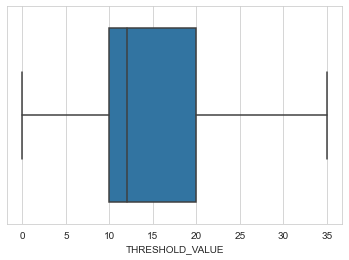

In [31]:
sns.boxplot(data=HR_threshold_check_high, x='THRESHOLD_VALUE')

In [36]:
# Now, let's refine and look only on THRESHOLD_VALUE smaller than 10 ...
HR_threshold_check_high = HR_violations[(HR_violations["THRESHOLD_TYPE"] == "HIGH") & (HR_violations["THRESHOLD_VALUE"] < 10)].sort_values(by=['THRESHOLD_VALUE'])
display(HR_threshold_check_high)
HR_threshold_check_high.THRESHOLD_VALUE.describe()

,ROW_ID,ICUSTAY_ID,ITEMID,CHARTTIME,VALUENUM,VALUEUOM,THRESHOLD_ROW_ID,THRESHOLD_ITEMID,THRESHOLD_CHARTTIME,THRESHOLD_VALUE,THRESHOLD_TYPE
180656,8966103,206855.0,220045,2200-10-24 09:00:00,63.0,bpm,8966095,220046,2200-10-24 08:09:00,0.00,HIGH
324271,3834265,246957.0,220045,2148-05-10 18:40:00,98.0,bpm,3834100,220046,2148-05-09 20:16:00,0.00,HIGH
324270,3834263,246957.0,220045,2148-05-10 18:00:00,82.0,bpm,3834100,220046,2148-05-09 20:16:00,0.00,HIGH
324269,3834261,246957.0,220045,2148-05-10 17:40:00,82.0,bpm,3834100,220046,2148-05-09 20:16:00,0.00,HIGH
324268,3834256,246957.0,220045,2148-05-10 17:00:00,90.0,bpm,3834100,220046,2148-05-09 20:16:00,0.00,HIGH
...,...,...,...,...,...,...,...,...,...,...,...
180779,8722191,206856.0,220045,2131-06-08 09:00:00,117.0,bpm,8722171,220046,2131-06-08 08:06:00,0.13,HIGH
285134,25794655,235196.0,220045,2143-02-22 20:00:00,89.0,bpm,25794630,220046,2143-02-22 16:36:00,1.00,HIGH
285131,25794635,235196.0,220045,2143-02-22 17:00:00,93.0,bpm,25794630,220046,2143-02-22 16:36:00,1.00,HIGH
285132,25794642,235196.0,220045,2143-02-22 18:00:00,92.0,bpm,25794630,220046,2143-02-22 16:36:00,1.00,HIGH


count    111.000000
mean       0.045405
std        0.188447
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        1.000000
Name: THRESHOLD_VALUE, dtype: float64

In [ ]:
#### To be continued ... ###

#HR_violations.THRESHOLD_VALUE.describe()
HR_violations[(HR_violations["THRESHOLD_VALUE"] < 10.0)]
# There are <inserst count> THRESHOLD_VALUEs that are 0 >= x =< 1, which is suspicious.
# Looking at the respective THRESHOLD_TYPEs, these are <check> mostly (?) of type HIGH.
# A possible explanation could be that ICU staff sets a too low threshold by mistake (e.g. typing 0 instead of 100). This would directly trigger an alarm.
# Keeping in mind that higher values nicht gerissen werden (dieses datnset enthält nur die violatios)